In [1]:
# импортируем все что нужно

import numpy as np
import pandas as pd
from pathlib import Path
from tqdm.notebook import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import cv2
import shutil
import copy

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset

In [2]:
# пути для инпут файлов, в папке images лежат изображения отобранные с помощью 1_Data_preparation.ipynb
# в selected_images.csv лежат bbox, атрибуты и прочее для этих изображений

data_path = Path("/kaggle/input/data-for-alignment")
images_path = data_path / "images"
csv_path = data_path / "selected_images.csv"

In [3]:
# сюда сэйвим кропнутые и ресайзнутые ("смотря какой fabric смотря сколько details") изображения

output_dir = Path("/kaggle/working")
crop_dir = output_dir / "faces_cropped"
resize_dir = output_dir / "faces_resized"

crop_dir.mkdir(exist_ok=True)
resize_dir.mkdir(exist_ok=True)

In [4]:
# проверяем сколько у нас всего отобранных изображений
file_count = len([f for f in images_path.iterdir() if f.is_file()])
file_count

25000

In [5]:
# проверяем что все выглядит ок
df_original = pd.read_csv(csv_path)
print(df_original.shape)
df_original.head()

(25000, 56)


,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y,identity
0,006439.jpg,-1,-1,-1,-1,-1,-1,-1,1,-1,...,130,219,130,199,155,181,171,219,170,1
1,111433.jpg,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,112,207,119,170,152,169,168,206,170,1
2,145590.jpg,1,-1,1,-1,-1,-1,-1,-1,-1,...,313,196,301,142,393,143,429,205,422,1
3,027827.jpg,1,-1,-1,1,-1,-1,-1,-1,-1,...,95,74,94,52,121,57,136,83,132,1
4,032404.jpg,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,203,245,201,215,244,184,272,248,266,1


In [6]:
# убираем все attributes, они здесь не понадобятся
# identities оставляем, они не нужны на данной шаге, но понадобятся на следущем шаге с классификацией

columns_to_keep = ["image_id",
                   "x_1", "y_1", "width", "height", 
                   "lefteye_x", "lefteye_y",
                   "righteye_x", "righteye_y",
                   "nose_x", "nose_y",
                   "leftmouth_x", "leftmouth_y",
                   "rightmouth_x", "rightmouth_y",
                   "identity"
                  ]

# проверяем что все выглядит ок
df_wh_attributes = df_original[columns_to_keep]
print(df_wh_attributes.shape)
df_wh_attributes.head()

(25000, 16)


,image_id,x_1,y_1,width,height,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y,identity
0,006439.jpg,145,77,107,148,178,130,219,130,199,155,181,171,219,170,1
1,111433.jpg,125,39,146,202,170,112,207,119,170,152,169,168,206,170,1
2,145590.jpg,4,156,315,435,101,313,196,301,142,393,143,429,205,422,1
3,027827.jpg,15,42,107,148,48,95,74,94,52,121,57,136,83,132,1
4,032404.jpg,123,113,179,248,178,203,245,201,215,244,184,272,248,266,1


In [7]:
# словарь с landmarks
landmarks = {
    "lefteye": ("lefteye_x", "lefteye_y"),
    "righteye": ("righteye_x", "righteye_y"),
    "nose": ("nose_x", "nose_y"),
    "leftmouth": ("leftmouth_x", "leftmouth_y"),
    "rightmouth": ("rightmouth_x", "rightmouth_y"),
}

In [8]:
SEED = 21

# MARGIN задает на сколько процентов мы изменяем bbox по сравнению с изначальным вариантом
# я поигрался чутка с этим параметром и остановился на -0.05
MARGIN = -0.05 

# Stacked Hourglass ожидает изображения одинакового размера
# так что мы должны после кропа все изображения привести к одному размеру TARGET_SIZE
# TARGET_SIZE выбрал как в оригинальной статье
TARGET_SIZE = 256

# размер хитмапы, тоже выбран как в статье
HM_SIZE = 64

In [9]:
# сначала изменяем bbox на MARGIN процентов
# потом обрезаем изображения по этим измененным bbox и переводим landmarks в координаты нового изображения

def expand_bbox(x, y, w, h, img_w, img_h, margin):
    m = int(max(w, h) * margin)
    x1 = max(0, x - m)
    y1 = max(0, y - m)
    x2 = min(img_w, x + w + m)
    y2 = min(img_h, y + h + m)
    return x1, y1, x2, y2

cropped_data = []

# пробегаем по всем изображениям
for row in tqdm(df_wh_attributes.itertuples(index=False), total=len(df_wh_attributes)):
    
    # читаем изображение
    img_path = images_path / row.image_id
    img = Image.open(img_path).convert("RGB")
    img_w, img_h = img.size
    
    # читаем bbox
    x, y, w, h = int(row.x_1), int(row.y_1), int(row.width), int(row.height)
    
    # изменяем bbox на margin %
    x1, y1, x2, y2 = expand_bbox(x, y, w, h, img_w, img_h, MARGIN)
    
    # обрезаем изображение по новому bbox и сохраняем
    face = img.crop((x1, y1, x2, y2))
    face.save(crop_dir / row.image_id, quality=95)
    
    # словарь для текущей строки, добавляем имя картинки и identity
    row_data = {'image_id': row.image_id, 'identity': row.identity}
    
    # пробегаем по всем landmarks для заданного изображения
    for name, (cx, cy) in landmarks.items():
        
        # координаты landmarks для оригинального изображения
        lx = getattr(row, cx)
        ly = getattr(row, cy)
        
        # переводим landmarks в координаты нового изображения
        new_lx = lx - x1
        new_ly = ly - y1
        
        # сохраняем в словарь
        row_data[cx] = new_lx
        row_data[cy] = new_ly
    
    # добавляем строку в список
    cropped_data.append(row_data)

# создаем DataFrame из списка словарей
df_cropped = pd.DataFrame(cropped_data)

  0%|          | 0/25000 [00:00<?, ?it/s]

In [10]:
print(df_cropped.shape)
df_cropped.head()

(25000, 12)


,image_id,identity,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y
0,006439.jpg,1,26,46,67,46,47,71,29,87,67,86
1,111433.jpg,1,35,63,72,70,35,103,34,119,71,121
2,145590.jpg,1,76,136,171,124,117,216,118,252,180,245
3,027827.jpg,1,26,46,52,45,30,72,35,87,61,83
4,032404.jpg,1,43,78,110,76,80,119,49,147,113,141


In [11]:
# приводим все изображения к TARGET_SIZE

resized_data = []

for row in tqdm(df_cropped.itertuples(index=False), total=len(df_cropped)):

    # читаем изображение
    img_path = crop_dir / row.image_id
    img = Image.open(img_path).convert("RGB")
    img_w, img_h = img.size

    # рескейлим изображение
    img_resized = img.resize((TARGET_SIZE, TARGET_SIZE), Image.BILINEAR)
    img_resized.save(resize_dir / row.image_id, quality=95)

    sx = TARGET_SIZE / img_w
    sy = TARGET_SIZE / img_h

    # словарь для текущей строки, добавляем имя картинки и identity
    row_data = {'image_id': row.image_id, 'identity': row.identity}
    
    # пробегаем по всем landmarks для заданного изображения
    for name, (cx, cy) in landmarks.items():
        
        # координаты landmarks для кропнутого изображения
        lx = getattr(row, cx)
        ly = getattr(row, cy)
        
        # переводим landmarks в координаты нового изображения
        new_lx = lx * sx
        new_ly = ly * sy
        
        # сохраняем в словарь
        row_data[cx] = new_lx
        row_data[cy] = new_ly
    
    # добавляем строку в список
    resized_data.append(row_data)

# создаем DataFrame из списка словарей
df_resized = pd.DataFrame(resized_data)

  0%|          | 0/25000 [00:00<?, ?it/s]

In [12]:
print(df_resized.shape)
df_resized.head()

(25000, 12)


,image_id,identity,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y
0,006439.jpg,1,71.569892,87.880597,184.430108,87.880597,129.376344,135.641791,79.827957,166.208955,184.430108,164.298507
1,111433.jpg,1,71.111111,88.615385,146.285714,98.461538,71.111111,144.879121,69.079365,167.384615,144.253968,170.197802
2,145590.jpg,1,71.267399,88.590331,160.351648,80.773537,109.714286,140.702290,110.652015,164.152672,168.791209,159.592875
3,027827.jpg,1,71.569892,87.880597,143.139785,85.970149,82.580645,137.552239,96.344086,166.208955,167.913978,158.567164
4,032404.jpg,1,71.019355,89.142857,181.677419,86.857143,132.129032,136.000000,80.929032,168.000000,186.632258,161.142857


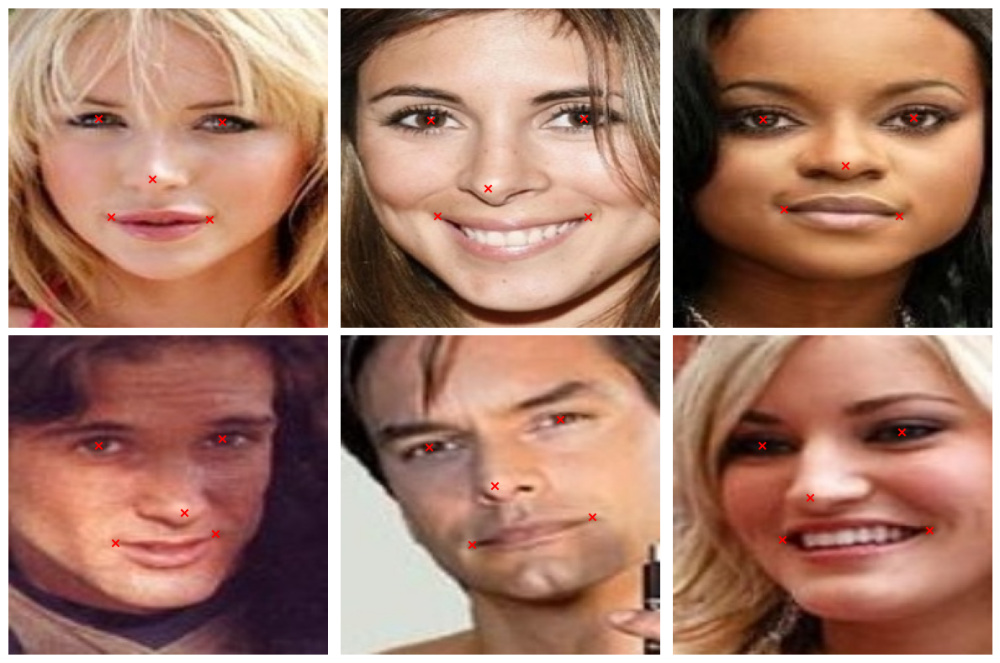

In [13]:
# отрисуем 6 рандомных картинок с landmarks, чтоб проверить, что все ок

sample = df_resized.sample(6)

plt.figure(figsize=(12, 8))

for i, row in enumerate(sample.itertuples(), 1):
    img = Image.open(resize_dir / row.image_id)
    plt.subplot(2, 3, i)
    plt.imshow(img)
    plt.axis("off")
    for name, (cx, cy) in landmarks.items():
        
        lx = getattr(row, cx)
        ly = getattr(row, cy)
        plt.scatter(lx, ly, marker = "x", color = "red")

plt.tight_layout()

окей, теперь у нас есть обрезанные картинки с одинаковым размером и правильными координатами ключевых точек
теперь надо из ключевых точек сделать хитмапы

In [14]:
# стандартная разбивка 80/10/10
df_train, df_tmp = train_test_split(df_resized, test_size=0.2, random_state=SEED, shuffle=True)
df_val, df_test  = train_test_split(df_tmp, test_size=0.5, random_state=SEED, shuffle=True)

In [15]:
# взято из ноутбука без изменений
def create_heatmap(size, landmark, sigma=2):
    
    x, y = landmark
    h, w = size

    # Обрезаем координаты, чтобы не выйти за пределы изображения
    x = min(max(0, int(x)), w - 1)
    y = min(max(0, int(y)), h - 1)

    xx, yy = np.meshgrid(np.arange(w), np.arange(h))
    heatmap = np.exp(-((yy - y)**2 + (xx - x)**2) / (2 * sigma**2))
    return heatmap

# взял из ноутбука, но изменил чутка
# теперь хитмапы могут быть другого размера нежели картинки. картинки я использовал 256х256, а хитмапы 64х64
# это сделано, чтобы ускорить вычисления 
# размер хитмапов 64 как в оригинальной статье

def landmarks_to_heatmaps(image_shape, hm_shape, landmarks, sigma=2):
    H_in, W_in = image_shape
    H_hm, W_hm = hm_shape
    sx = W_hm / float(W_in)
    sy = H_hm / float(H_in)

    heatmaps = []
    # проходим по всем точкам в landmarks
    for (x, y) in landmarks:
        # создаём heatmap в масштабированных координатах
        hm = create_heatmap((H_hm, W_hm), (x*sx, y*sy), sigma=sigma)
        heatmaps.append(hm)

    return np.array(heatmaps)

In [16]:
# будем использовать Dataset
# на вход принимаем 256x256 обрезанные изображения и создаем 5x64x64 хитмапы для них

class FaceHM256Dataset(Dataset):

    def __init__(self, df, img_root, hm_size, sigma):
        
        self.df = df.reset_index(drop=True)
        self.img_root = Path(img_root)
        self.hm_size = hm_size
        self.sigma = float(sigma)

        # Названия столбцов с координатами ключевых точек лица
        self.lm_cols = [
            "lefteye_x","lefteye_y",
            "righteye_x","righteye_y",
            "nose_x","nose_y",
            "leftmouth_x","leftmouth_y",
            "rightmouth_x","rightmouth_y",
        ]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx: int):
        
        row = self.df.iloc[idx]
        img_path = self.img_root / row["image_id"]

        img = Image.open(img_path).convert("RGB")

        # извлекаем координаты ключевых точек и преобразуем в массив формы (5, 2)
        lm = np.array(row[self.lm_cols], dtype=np.float32).reshape(5,2)  

        # генерим хитмапы из ключевых точек
        hms = landmarks_to_heatmaps(img.size, self.hm_size, lm,self.sigma)
        hms = hms.astype(np.float32)

        # нормируем и меняем порядок на (C,H,W)
        img_t = torch.from_numpy(np.array(img, dtype=np.float32)/255.0).permute(2,0,1)

        hms_t = torch.from_numpy(hms).float()  

        identity = int(row["identity"])

        # возвращаем изображение, хитмап, ключевые точки, ID изображения, identity
        return img_t, hms_t, torch.from_numpy(lm), row["image_id"], identity


In [17]:
# создаем датасеты
train_ds = FaceHM256Dataset(df_train, resize_dir, hm_size=(HM_SIZE,HM_SIZE), sigma=2.0)
val_ds   = FaceHM256Dataset(df_val,   resize_dir, hm_size=(HM_SIZE,HM_SIZE), sigma=2.0)
test_ds  = FaceHM256Dataset(df_test,  resize_dir, hm_size=(HM_SIZE,HM_SIZE), sigma=2.0)

In [18]:
# создаем DataLoaders

BATCH_SIZE = 32
NUM_WORKERS = 2

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

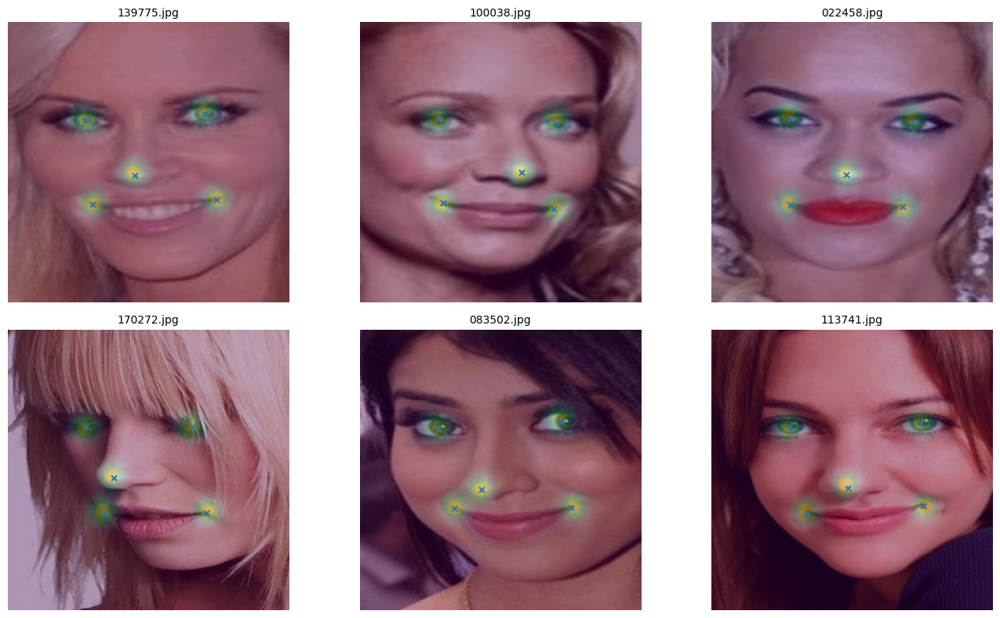

In [19]:
# отрисуем несколько изображений, чтобы убедится, что все ок

def show_samples(ds, n):
    
    rng = np.random.default_rng(SEED)
    idxs = rng.choice(len(ds), size=min(n, len(ds)), replace=False)

    plt.figure(figsize=(14, 8))
    for i, idx in enumerate(idxs, 1):
        
        img_t, hms_t, lm_t, fname, identity = ds[idx]

        img = img_t.permute(1,2,0).cpu().numpy()
        hms = hms_t.numpy()                   
        lm  = lm_t.numpy()                    

        hm_sum = hms.sum(axis=0)
        hm_sum = (hm_sum - hm_sum.min()) / (hm_sum.max() - hm_sum.min() + 1e-6)

        hm_up = torch.from_numpy(hm_sum)[None,None,:,:]  
        hm_up = torch.nn.functional.interpolate(hm_up, size=(256,256), mode="bilinear", align_corners=False)[0,0].numpy()

        ax = plt.subplot(2, 3, i)
        ax.imshow(img)
        ax.imshow(hm_up, alpha=0.35)
        ax.scatter(lm[:,0], lm[:,1], s=25, marker="x")
        ax.set_title(fname, fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

show_samples(train_ds, 6)

все выглядит ок

In [20]:
# реализация взята прямиком из ноутбука с заданием

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.skip = nn.Identity() if in_channels == out_channels else nn.Conv2d(in_channels, out_channels, 1)

        self.conv1 = nn.Conv2d(in_channels, out_channels // 2, 1)
        self.bn1 = nn.BatchNorm2d(out_channels // 2)
        self.conv2 = nn.Conv2d(out_channels // 2, out_channels // 2, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels // 2)
        self.conv3 = nn.Conv2d(out_channels // 2, out_channels, 1)
        self.bn3 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = self.skip(x)
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))
        x = self.bn3(self.conv3(x))
        return self.relu(x + residual)

In [21]:
# Ну собственно сам Hourglass модуль
# Сначала уменьшает разрешение (encoder), затем увеличивает (decoder), при этом используя skip-connections для сохранения деталей

class Hourglass(nn.Module):

    def __init__(self, depth, channels):
        super().__init__()
        self.depth = depth  # глубина рекурсии (сколько раз будем уменьшать разрешение)
        self.channels = channels  # количество каналов во всех слоях
        
        # Верхняя ветка (skip connection) - сохраняет исходное разрешение
        # Это параллельный путь, который идёт в обход downsample/upsample
        self.res_up = ResidualBlock(channels, channels)
        
        # Нижняя ветка - путь с уменьшением/увеличением разрешения:
        self.res_low1 = ResidualBlock(channels, channels)  # обработка перед downsample
        self.down = nn.MaxPool2d(2, 2)  # уменьшаем разрешение в 2 раза (H/2, W/2)
        self.res_low2 = ResidualBlock(channels, channels)  # обработка после downsample
        
        # Рекурсивная часть:
        if depth > 1:
            # Если ещё не достигли дна, создаём вложенный hourglass меньшей глубины
            self.low = Hourglass(depth - 1, channels)
        else:
            # Если depth == 1, это самый нижний уровень (bottleneck)
            # Просто обрабатываем признаки без дальнейшего downsample
            self.low = ResidualBlock(channels, channels)
        
        # Обработка после рекурсивной части, перед upsample
        self.res_low3 = ResidualBlock(channels, channels)
        
    def forward(self, x):
        # Верхняя ветка (skip connection)
        # Обрабатываем входные данные на исходном разрешении
        up1 = self.res_up(x)
        
        # Нижняя ветка (encoder-decoder)
        # Подготовка к понижению разрешения
        low = self.res_low1(x)
        
        # Уменьшаем разрешение в 2 раза 
        low = self.down(low)
        
        # Обрабатываем признаки на пониженном разрешении
        low = self.res_low2(low)
        
        # Рекурсивная часть или bottleneck:
        # Если depth > 1, вызываем вложенный Hourglass
        # Если depth == 1, просто обрабатываем через ResidualBlock
        low = self.low(low)
        
        # Ещё одна обработка после рекурсивной части
        low = self.res_low3(low)
        
        # Восстанавливаем разрешение обратно 
        up2 = F.interpolate(low, scale_factor=2, mode="nearest")
        
        # Складываем результаты верхней и нижней веток
        return up1 + up2


In [22]:
# голова сети, где мы преобразует признаки в тепловые карты для каждого landmark

class Head(nn.Module):
    def __init__(self, channels, num_landmarks):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.BatchNorm2d(channels), 
            nn.ReLU(inplace=True), 
            # Каждый канал выхода = хитмап для одного landmark
            nn.Conv2d(channels, num_landmarks, 1)
        )
        
    def forward(self, x):
        # На входе (B, channels, H, W)
        # На выходе (B, num_landmarks, H, W)
        return self.block(x)

In [23]:
# теперь стэкаем несколько Hourglass модулей
# каждый Hourglass предсказывает хитмапы и эти предсказания используютсядля улучшения следующего Hourglass в стеке

class StackedHourglass(nn.Module):
    def __init__(self, num_stacks, num_landmarks, channels, depth):
        super().__init__()
        self.num_stacks = num_stacks  # количество последовательных Hourglass модулей
        self.num_landmarks = num_landmarks  # количество landmark для детекции
        
        # начальный блок обработки картинки на входе
        # берем сырые пиксели, сжимает картинку, делает больше каналов и вытаскивает базовые штуки вроде краёв и форм
        self.stem = nn.Sequential(
            nn.Conv2d(3, 64, 7, stride=2, padding=3),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            ResidualBlock(64, 128),
            nn.MaxPool2d(2, 2),
            ResidualBlock(128, 128),
            ResidualBlock(128, channels),
        )
        
        # создаём список из num_stacks Hourglass модулей
        # каждый Hourglass имеет одинаковую архитектуру
        self.hourglasses = nn.ModuleList([
            Hourglass(depth, channels) for _ in range(num_stacks)
        ])
        
        # создаём список голов, по одной на каждый Hourglass
        # каждая голова генерирует хитмапы
        self.heads = nn.ModuleList([
            Head(channels, num_landmarks) for _ in range(num_stacks)
        ])
        
        # Связб между Hourglass
        self.feat_to_feat = nn.ModuleList([
            nn.Conv2d(channels, channels, 1) for _ in range(num_stacks - 1)
        ])
        
        # Преобразование предсказанных хитмапов обратно в пространство признаков
        self.hm_to_feat = nn.ModuleList([
            nn.Conv2d(num_landmarks, channels, 1) for _ in range(num_stacks - 1)
        ])
        
    def forward(self, x):
        # пропускаем изображение через stem
        # На входе(B, 3, H, W) 
        # На выходе (B, channels, H/4, W/4)
        x = self.stem(x)
        
        # Список для сохранения всех промежуточных предсказаний
        outputs = []
        
        # Проходим через каждый Hourglass в стеке
        for i in range(self.num_stacks):
            # Пропускаем признаки через i-ый Hourglass
            feat = self.hourglasses[i](x) 
            
            # Генерируем хитмапы из признаков
            hm = self.heads[i](feat)  
            
            # Сохраняем предсказания для loss на каждом уровне
            outputs.append(hm)
            
            # Если это не последний стек, то подготавливаем вход для следующего
            if i < self.num_stacks - 1:
                # Складываем исходные признаки x, новые признаки из текущего Hourglass feat и уже предсказанные хитмапы hm
                x = x + self.feat_to_feat[i](feat) + self.hm_to_feat[i](hm)
        
        # Возвращаем список всех предсказаний
        return outputs

In [24]:
# переводим хитмары в точки
@torch.no_grad()
def heatmaps_to_points(hm):
    B, N, H, W = hm.shape 
    flat = hm.view(B, N, -1) # разворачиваем H*W в одно измерение
    idx = flat.argmax(dim=-1) # находим индекс максимального значения         
    
    # преобразуем линейный индекс обратно в 2D координаты
    y = idx // W
    x = idx % W
    
    # объединяем x и y в один тензор формата (B, N, 2)
    pts = torch.stack([x, y], dim=-1).float()
    return pts

# преобразует координаты из системы координат хитмапа в систему координат исходного изображения
@torch.no_grad()
def hm_points_to_img_points(pts_hm, input_size, hm_size):
    # вычисляем коэффициент масштабирования между хитмапом и изображением
    scale = input_size / float(hm_size)
    return pts_hm * scale

In [25]:
# вычисляет Normalized Mean Error (NME) между предсказанными и истинными точками (нормализуем на расстояние между глязами)
# эту метрику я подсмотрел из статей, например тут она упоминается, формула 7
# https://arxiv.org/pdf/1904.07399
# идея простая - находим обычное l2 расстояние и делим его на расстояние между глазами. это делается, чтобы лица с разными размерами и расстояние к "камере" давали одинаковый вклад в метрику

@torch.no_grad()
def nme_metric(pred_pts_img, gt_pts_img):

    eps=1e-6

    # вычисляем расстояние
    err = torch.norm(pred_pts_img - gt_pts_img, dim=-1)  
    mean_err = err.mean(dim=-1)                          

    # нормализуем
    iod = torch.norm(gt_pts_img[:, 0] - gt_pts_img[:, 1], dim=-1)  
    nme = mean_err / (iod + eps)
    
    return nme.mean().item()

In [26]:
# тут все стандартно

@torch.no_grad()
def validate_epoch(model, val_loader, criterion, device, hm_size, input_size):
    model.eval()
    total_loss = 0.0
    total_nme = 0.0
    n_batches = 0

    # проходим по бачам
    for batch in tqdm(val_loader, desc="val", leave=False):

        images, target_hm, lm_gt, fnames, identities = batch

        images = images.to(device)
        target_hm = target_hm.to(device)
        lm_gt = lm_gt.to(device)  

        outputs = model(images)  

        # Intermediate Supervision как описано в ноутбуке с заданием
        losses = [criterion(o, target_hm) for o in outputs]
        loss = sum(losses) / len(losses)

        # берем предсказание модели, переводим в хитмапы в точки
        pred_hm = outputs[-1] 
        pred_pts_hm = heatmaps_to_points(pred_hm)                       
        pred_pts_img = hm_points_to_img_points(pred_pts_hm, input_size=input_size, hm_size=hm_size)

        # считаем метрику и лосс
        nme = nme_metric(pred_pts_img, lm_gt)

        total_loss += loss.item()
        total_nme += nme
        n_batches += 1

    return total_loss / max(1, n_batches), total_nme / max(1, n_batches)

In [27]:
# будем отрисовывать ground truth и предсказания для некоторых эпох

@torch.no_grad()
def visualize_batch_predictions(
    model,
    batch,
    device,
    hm_size,
    input_size,
    max_images,
):

    model.eval()

    images, target_hm, lm_gt, fnames, identities = batch
    images = images.to(device)
    lm_gt = lm_gt.to(device)

    outputs = model(images)
    pred_hm = outputs[-1]  

    pred_pts_hm = heatmaps_to_points(pred_hm)  
    pred_pts_img = hm_points_to_img_points(
        pred_pts_hm, input_size=input_size, hm_size=hm_size
    )  

    images_np = images.cpu().permute(0, 2, 3, 1).numpy()

    B = images_np.shape[0]
    n_show = min(B, max_images)

    plt.figure(figsize=(4 * n_show, 4))
    for i in range(n_show):
        plt.subplot(1, n_show, i + 1)
        plt.imshow(images_np[i])
        plt.scatter(
            lm_gt[i, :, 0].cpu(),
            lm_gt[i, :, 1].cpu(),
            c="lime",
            s=40,
            marker="x",
            label="ground truth",
        )
        plt.scatter(
            pred_pts_img[i, :, 0].cpu(),
            pred_pts_img[i, :, 1].cpu(),
            c="red",
            s=40,
            marker="o",
            label="prediciton",
        )
        plt.title(fnames[i], fontsize=9)
        plt.axis("off")

        if i == 0:
            plt.legend()

    plt.tight_layout()
    plt.show()


In [28]:
# тут тоже все стандартно

def train_epoch(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    n_batches = 0

    for batch in tqdm(train_loader, desc="train", leave=False):
        
        images, target_hm, lm_gt, fnames, identities = batch  
        images = images.to(device)
        target_hm = target_hm.to(device)

        outputs = model(images)

        # Intermediate Supervision как описано в ноутбуке с заданием
        losses = [criterion(o, target_hm) for o in outputs]
        loss = sum(losses) / len(losses)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        n_batches += 1

    return total_loss / max(1, n_batches)

In [29]:
# и тут все стандартно

def fit(
    model,
    train_loader,
    val_loader,
    optimizer,
    device,
    epochs,
    hm_size,
    input_size,
    ckpt_path
):
    
    criterion = torch.nn.MSELoss() # звял обычный MSE, хотя было бы интересно попробовать что-нибудь другое, но руки не дошли
    best_val_nme = float("inf")

    history = {
        "train_loss": [],
        "val_loss": [],
        "val_nme": [],
    }

    for epoch in range(1, epochs + 1):
        train_loss = train_epoch(model, train_loader, optimizer, criterion, device)
        val_loss, val_nme = validate_epoch(model, val_loader, criterion, device, hm_size=hm_size, input_size=input_size)

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["val_nme"].append(val_nme)

        print(f"Epoch {epoch:02d} train_loss={train_loss:.4f} val_loss={val_loss:.4f} val_NME={val_nme:.4f}")

        if epoch % 5 == 0:
            batch0 = next(iter(val_loader))
            visualize_batch_predictions(
                model,
                batch0,
                device,
                hm_size=HM_SIZE,
                input_size=TARGET_SIZE,
                max_images=5,
            )

        if val_nme < best_val_nme:

            best_val_nme = val_nme

            # сохраняем веса лучшей модели, у которой наименьшее NME
            torch.save(
                {
                    "model_state_dict": model.state_dict(),
                    "optimizer_state_dict": optimizer.state_dict(),
                    "epoch": epoch,
                    "best_val_nme": best_val_nme,
                    "history": history,
                    "meta": {
                        "arch": "StackedHourglass",
                        "num_stacks": model.num_stacks,
                        "num_landmarks": model.num_landmarks,
                        "channels": 256,
                        "depth": 4,
                        "input_size": 256,
                        "hm_size": 64,
                    },
                },
                ckpt_path,
            )
            
            print(f"!!! Saved best checkpoint, val_NME={best_val_nme:.6f}")

    return history

In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 01 train_loss=0.0034 val_loss=0.0007 val_NME=0.0469
!!! Saved best checkpoint, val_NME=0.046862


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 02 train_loss=0.0004 val_loss=0.0006 val_NME=0.0441
!!! Saved best checkpoint, val_NME=0.044088


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 03 train_loss=0.0003 val_loss=0.0003 val_NME=0.0381
!!! Saved best checkpoint, val_NME=0.038102


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 04 train_loss=0.0003 val_loss=0.0004 val_NME=0.0392


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 05 train_loss=0.0003 val_loss=0.0004 val_NME=0.0445


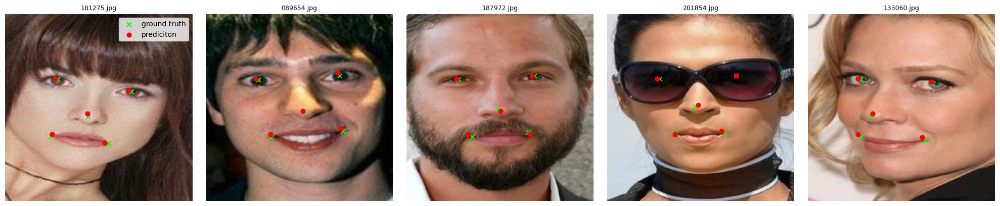

train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 06 train_loss=0.0002 val_loss=0.0004 val_NME=0.0433


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 07 train_loss=0.0002 val_loss=0.0005 val_NME=0.0508


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 08 train_loss=0.0002 val_loss=0.0007 val_NME=0.0543


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 09 train_loss=0.0002 val_loss=0.0006 val_NME=0.0487


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 10 train_loss=0.0002 val_loss=0.0007 val_NME=0.0559


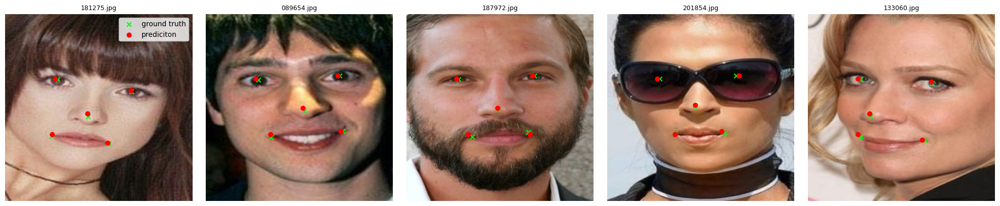

train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 11 train_loss=0.0002 val_loss=0.0003 val_NME=0.0394


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 12 train_loss=0.0002 val_loss=0.0003 val_NME=0.0389


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 13 train_loss=0.0002 val_loss=0.0003 val_NME=0.0398


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 14 train_loss=0.0002 val_loss=0.0003 val_NME=0.0432


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 15 train_loss=0.0002 val_loss=0.0002 val_NME=0.0384


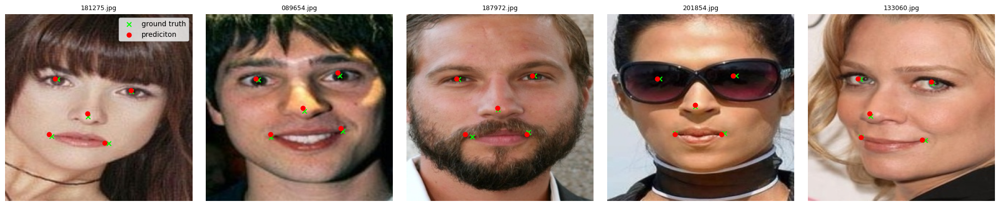

train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 16 train_loss=0.0002 val_loss=0.0003 val_NME=0.0413


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 17 train_loss=0.0002 val_loss=0.0002 val_NME=0.0425


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 18 train_loss=0.0002 val_loss=0.0002 val_NME=0.0372
!!! Saved best checkpoint, val_NME=0.037240


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 19 train_loss=0.0002 val_loss=0.0003 val_NME=0.0372
!!! Saved best checkpoint, val_NME=0.037182


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 20 train_loss=0.0002 val_loss=0.0003 val_NME=0.0354


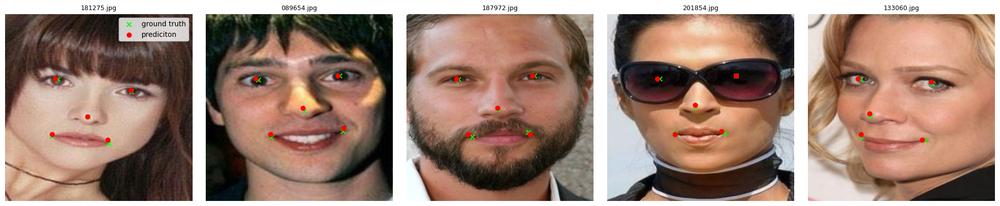

!!! Saved best checkpoint, val_NME=0.035372


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 21 train_loss=0.0002 val_loss=0.0002 val_NME=0.0379


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 22 train_loss=0.0002 val_loss=0.0003 val_NME=0.0400


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 23 train_loss=0.0002 val_loss=0.0003 val_NME=0.0372


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 24 train_loss=0.0002 val_loss=0.0003 val_NME=0.0398


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 25 train_loss=0.0002 val_loss=0.0004 val_NME=0.0351


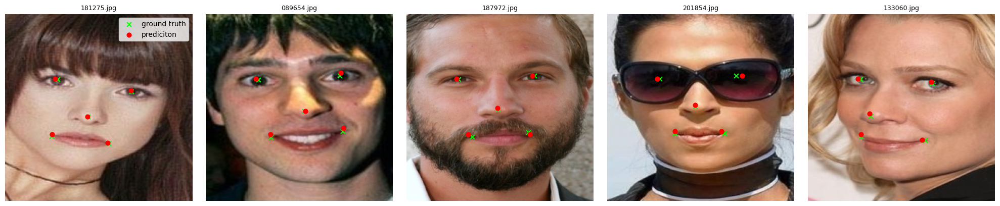

!!! Saved best checkpoint, val_NME=0.035107


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 26 train_loss=0.0002 val_loss=0.0003 val_NME=0.0388


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 27 train_loss=0.0002 val_loss=0.0003 val_NME=0.0369


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 28 train_loss=0.0002 val_loss=0.0003 val_NME=0.0404


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 29 train_loss=0.0002 val_loss=0.0009 val_NME=0.0376


train:   0%|          | 0/625 [00:00<?, ?it/s]

val:   0%|          | 0/79 [00:00<?, ?it/s]

Epoch 30 train_loss=0.0002 val_loss=0.0003 val_NME=0.0368


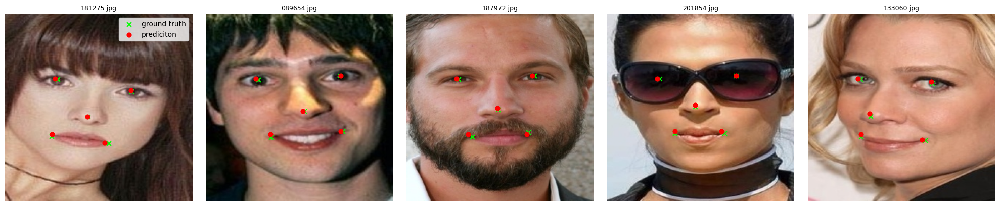

In [31]:
EPOCHS = 30
BEST_PATH = "best_stacked_hg.pth"

# гиперпараметры особо не оптимизировал, наверняка можно и получше комбинации найти
model = StackedHourglass(num_stacks=2, num_landmarks=5, channels=256, depth=4).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-4)

history_hourglass = fit(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    device=device,
    epochs=EPOCHS,
    hm_size=HM_SIZE,
    input_size=TARGET_SIZE,
    ckpt_path=BEST_PATH
)

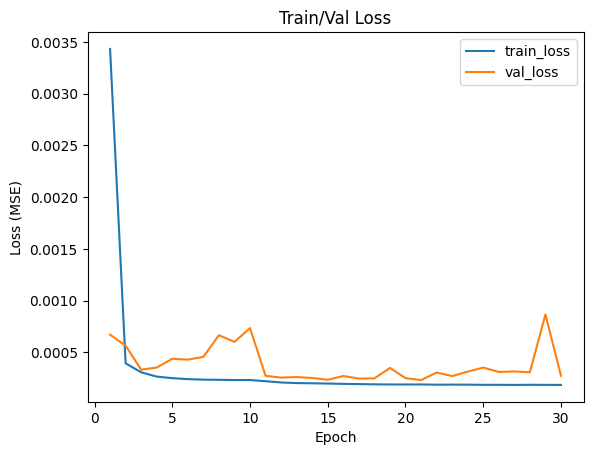

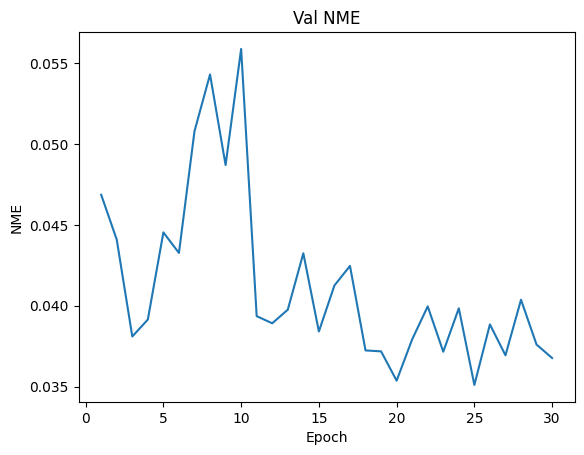

In [32]:
# отрисуем лоссы и NME как функции количества эпо    

epochs = range(1, len(history_hourglass["train_loss"]) + 1)

plt.figure()
plt.plot(list(epochs), history_hourglass["train_loss"])
plt.plot(list(epochs), history_hourglass["val_loss"])
plt.xlabel("Epoch")
plt.ylabel("Loss (MSE)")
plt.title("Train/Val Loss")
plt.legend(["train_loss", "val_loss"])
plt.show()

plt.figure()
plt.plot(list(epochs), history_hourglass["val_nme"])
plt.xlabel("Epoch")
plt.ylabel("NME")
plt.title("Val NME")
plt.show()

видим что модель ошибается всего на пару процентов от нормализированного расстояния, так что все ок как по мне

In [33]:
# загрузим лучшую модель
ckpt = torch.load(BEST_PATH, map_location=device)
best_model = copy.deepcopy(model)  
best_model.load_state_dict(ckpt["model_state_dict"])
best_model.to(device)
best_model.eval()

print("Best epoch:", ckpt.get("epoch"), "best_val_nme:", ckpt.get("best_val_nme"))

Best epoch: 25 best_val_nme: 0.035107438605797445


In [34]:
@torch.no_grad()
def evaluate_nme(model, loader, device, hm_size, input_size):
    model.eval()
    total_nme, n_batches = 0.0, 0

    for images, target_hm, lm_gt, fnames, identities in tqdm(loader, desc="test", leave=False):
        images = images.to(device).float()
        lm_gt = lm_gt.to(device).float()

        outputs = model(images)
        pred_hm = outputs[-1]
        pred_pts_hm = heatmaps_to_points(pred_hm)
        pred_pts_img = hm_points_to_img_points(pred_pts_hm, input_size=input_size, hm_size=hm_size)

        total_nme += nme_metric(pred_pts_img, lm_gt)
        n_batches += 1

    return total_nme / max(1, n_batches)

In [35]:
# считаем NME на тесте
test_nme = evaluate_nme(best_model, test_loader, device, hm_size=HM_SIZE, input_size=TARGET_SIZE)
print("TEST NME:", test_nme)

test:   0%|          | 0/79 [00:00<?, ?it/s]

TEST NME: 0.037747209396543385


In [36]:
@torch.no_grad()
def visualize_predictions(
    model,
    loader,
    device,
    hm_size,
    input_size,
    n_images,
    seed=SEED
):
    model.eval()
    rng = np.random.default_rng(seed)

    collected = []
    for batch in loader:
        images, target_hm, lm_gt, fnames, identities = batch
        B = images.shape[0]
        for i in range(B):
            collected.append((images[i], lm_gt[i], fnames[i]))
        if len(collected) >= n_images:
            break

    idxs = rng.choice(len(collected), size=min(n_images, len(collected)), replace=False)
    samples = [collected[i] for i in idxs]

    imgs_t = torch.stack([s[0] for s in samples], dim=0).to(device).float()
    lm_gt = torch.stack([s[1] for s in samples], dim=0).to(device).float()
    fnames = [s[2] for s in samples]

    outputs = model(imgs_t)
    pred_hm = outputs[-1]
    pred_pts_hm = heatmaps_to_points(pred_hm)
    pred_pts_img = hm_points_to_img_points(pred_pts_hm, input_size=input_size, hm_size=hm_size)

    imgs_np = imgs_t.cpu().permute(0,2,3,1).numpy()

    cols = 6
    rows = int(np.ceil(len(samples) / cols))
    plt.figure(figsize=(cols*3.3, rows*3.3))

    for i in range(len(samples)):
        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(imgs_np[i])

        gt = lm_gt[i].cpu().numpy()
        pr = pred_pts_img[i].cpu().numpy()

        ax.scatter(gt[:,0], gt[:,1], c="lime", s=35, marker="x")
        ax.scatter(pr[:,0], pr[:,1], c="red",  s=25, marker="o")
        ax.set_title(fnames[i], fontsize=8)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

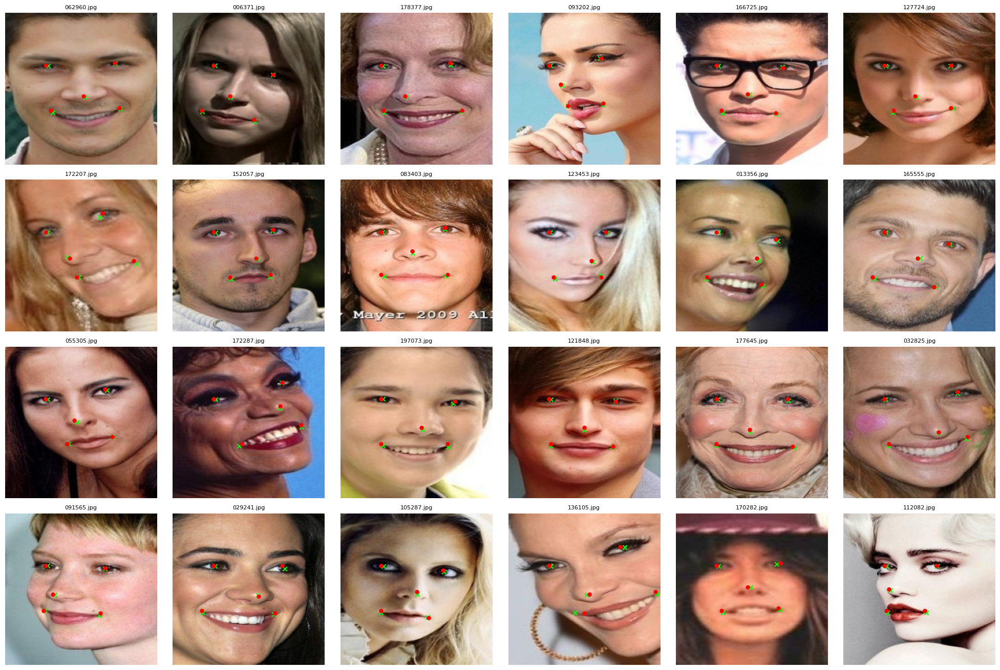

In [37]:
# отрисуем несколько картинок и посмотрим как далеко предсказания от ground truth
visualize_predictions(best_model, test_loader, device, hm_size = HM_SIZE, input_size = TARGET_SIZE, n_images=24)

In [38]:
# эта функция задает координаты ключевый точек на выровненной кратинки
# тоесть мы тут руками задаем где должен находится левый глаз, где правый и т.д.
# я чутка поигрался с этими цифрами, вроде они ок сейчас

def get_canonical_5pts(output_size):
    W = H = output_size
    return np.array([
        [0.30 * W, 0.35 * H],  # левый глаз
        [0.70 * W, 0.35 * H],  # правый глаз
        [0.50 * W, 0.52 * H],  # нос
        [0.35 * W, 0.75 * H],  # левый угол рта
        [0.65 * W, 0.75 * H],  # правый угол рта
    ], dtype=np.float32)

# тут мы выравниваем картинку с помощью аффинного преобразования
# тоесть берем на вход предсказание модели src, говорим как должны быть расположены ключевые точки dst, находим нужное преобразование M и с его помощью меняет исходную картинку
def align_face_affine(img_rgb, src_pts_5, output_size):

    src = np.asarray(src_pts_5, dtype=np.float32)
    dst = get_canonical_5pts(output_size=output_size)

    M, inliers = cv2.estimateAffinePartial2D(src, dst, method=cv2.LMEDS)

    aligned = cv2.warpAffine(img_rgb, M, (output_size, output_size), flags=cv2.INTER_LINEAR)
    return aligned

In [39]:
# вспомагательныя функция чтобы выровнять картики

@torch.no_grad()
def create_aligned_dataset_from_loader(
    model,
    loader,
    device,
    src_img_dir,               
    out_dir,
    output_size,
    hm_size,
    input_size,
    csv_name
):
    model.eval()
    src_img_dir = Path(src_img_dir)
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    rows = []
    saved = 0

    # бежим по батчам
    for images, target_hm, lm_gt, fnames, identities in tqdm(loader, desc="align", leave=False):

        # находим предсказанные ключевые точки
        outputs = model(images.to(device).float())
        pred_hm = outputs[-1]
        pred_pts_hm = heatmaps_to_points(pred_hm)
        pred_pts_img = hm_points_to_img_points(pred_pts_hm, input_size=input_size, hm_size=hm_size)
        pred_pts = pred_pts_img.cpu().numpy()  

        # бежим по картинкам в батче и выравниваем их

        for i in range(len(fnames)):
            fname = fnames[i]
            identity = int(identities[i])
            img_path = src_img_dir / fname
 
            img = cv2.imread(str(img_path))  
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            aligned = align_face_affine(img, pred_pts[i], output_size=output_size)

            out_path = out_dir / fname
            out_path.parent.mkdir(parents=True, exist_ok=True)
            cv2.imwrite(str(out_path), cv2.cvtColor(aligned, cv2.COLOR_RGB2BGR))

            rows.append({
                "image_id": fname,
                "identity": identity
            })

    df_out = pd.DataFrame(rows)
    df_out.to_csv(out_dir / csv_name, index=False)
    return df_out

In [40]:
# засовывем все вместе в больной датасет и лоудер

big_dataset = ConcatDataset([
    train_loader.dataset,
    val_loader.dataset,
    test_loader.dataset,
])

big_loader = DataLoader(
    big_dataset,
    batch_size=train_loader.batch_size,   
    shuffle=False,                       
    num_workers=train_loader.num_workers,
    pin_memory=True,
)

# выравниваем все картинки
df_aligned_all = create_aligned_dataset_from_loader(
    best_model, 
    big_loader, 
    device,
    src_img_dir=resize_dir,
    out_dir="/kaggle/working/faces_aligned_pred_all",
    output_size = TARGET_SIZE,
    hm_size = HM_SIZE,
    input_size = TARGET_SIZE,
    csv_name="aligned_pred_all.csv"
)

align:   0%|          | 0/782 [00:00<?, ?it/s]

In [41]:
# проверяем что все ок
df_aligned_all.shape

(25000, 2)

In [42]:
# проверяем что все ок
out_dir = Path("/kaggle/working/faces_aligned_pred_all")

file_count = len([f for f in out_dir.iterdir() if f.is_file()])
file_count

25001

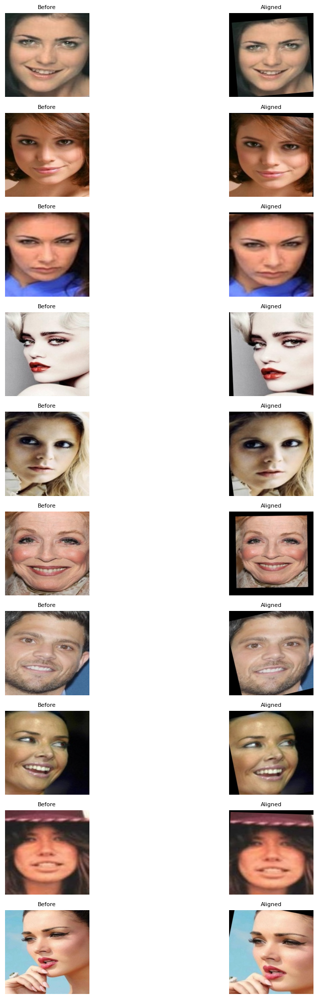

In [43]:
# отрисуем парочку картинок, чтобы посмотреть как работаем выравнивание

def show_before_after(src_dir, aligned_dir, filenames, n):
    src_dir = Path(src_dir)
    aligned_dir = Path(aligned_dir)
    rng = np.random.default_rng(SEED)
    picks = rng.choice(filenames, size=min(n, len(filenames)), replace=False)

    plt.figure(figsize=(12, 2*n))
    for i, fn in enumerate(picks, 1):
        src = cv2.cvtColor(cv2.imread(str(src_dir/fn)), cv2.COLOR_BGR2RGB)
        ali = cv2.cvtColor(cv2.imread(str(aligned_dir/fn)), cv2.COLOR_BGR2RGB)

        ax1 = plt.subplot(n, 2, 2*i-1)
        ax1.imshow(src); ax1.set_title(f"Before", fontsize=8); ax1.axis("off")

        ax2 = plt.subplot(n, 2, 2*i)
        ax2.imshow(ali); ax2.set_title("Aligned", fontsize=8); ax2.axis("off")

    plt.tight_layout()
    plt.show()

batch = next(iter(test_loader))
fnames = batch[3]
show_before_after(resize_dir, "/kaggle/working/faces_aligned_pred_all", fnames, n=10)

In [44]:
# были какие-то проблемы с кагглом, так что подчищаем память
shutil.rmtree("/kaggle/working/faces_cropped")
shutil.rmtree("/kaggle/working/faces_resized")

In [45]:
# закидываем все в зип
!cd /kaggle/working && zip -rq data-for-recognition.zip faces_aligned_pred_all best_stacked_hg.pth